## Table of Contents
* [1. Introduction](#chapter1)

* [2. Data Preparation](#chapter2)
    * [2.1 Import packages](#section_2_1)
    * [2.2 Identify rows with the missing dependent variable values](#section_2_2)
    * [2.3 Data transformation to create new variables](#section_2_3)
    * [2.4 Identify rows with missing independent variable values](#section_2_4)
    * [2.5 Categorise the dependent variable](#section_2_5)
    * [2.6 Convert variables to their respective data type](#section_2_6)

* [3. Exploratory and Descriptive Analysis](#chapter3)
    * [3.1 Data Visualisations](#section_3_1)
    * [3.2 Correlation Visualisation](#section_3_2)
    * [3.3 GPS Coordinates](#section_3_3)
    
* [4. Linear Regression](#chapter4)
    * [4.1 First Linear Regression](#section_4_1)
    * [4.2 Second Linear Regression](#section_4_2)
    
* [5. Additional Regression Models](#chapter5)
    * [5.1 Support Vector Machine](#section_5_1)
    * [5.2 Extreme Gradient Boosting](#section_5_2)

* [6. Conclusions](#chapter6)
* [7. Limitations](#chapter7)
* [8. References](#chapter8)
* [9. Appendix](#chapter9)
    * [9.1 Attribution Statement](#section_9_1)
    * [9.2 Project Management](#section_9_2)
    * [9.3 Word Count](#section_9_3)

# Introduction

Fire incidents are becoming one of the most urgent global issues. According to recent studies, the cost of fires in developed countries is estimated to reach 1% of the GDP amounting to around \\$76bn worldwide (Universitas21, no date). Looking at specific countries, the estimated economic lost due to fire incidents in UK between 2017 and 2018 was between £5.73bn and £11.46bn (NFCC, 2019), while in 2016, the economic loss in Canada on cost of fires were up to $7.6 billion (Douglas, 2016). This project is to focus on the estimated economic loss on fire of Canada's largest city, Toronto, due to the recent news that the city is facing an understaffed and tight budget for fire issues, especially during periods of COVID restrictions when residents were encouraged to spend more time at home (Boisvert, 2021). There were 10% of fire trucks unavailable due to insufficient firefighters; according to the Toronto Professional Fire Fighters Association (TPFFA). Our target is to know the estimated economic loss on fire as a reference for the government's budgeting.

By considering how much money the government should budget for the fire department, we believe it is significant to know the loss of economic cost fire incidents can cause. Therefore, we will answer the following question: **What is the estimated economic loss of a fire incident?**

# Data Preparation

We use data on fire incidents provided by the City of Toronto (https://ckan0.cf.opendata.inter.prod-toronto.ca/tl/dataset/fire-incidents/resource/fa5c7de5-10f8-41cf-883a-9b30a67c7b56). It was last updated on 15/11/2022 on ckan open resources platform. The dataset provides fire incident information from the Ontario Fire Marshal. It should be noted that the data set excluded personal information and the exact address was excluded due to privacy purposes (Ckan, 2022).

In [9]:
import pandas as pd
df = pd.read_csv('fire-incidents-data.csv')
df.shape

(17536, 43)

This dataset contains 43 columns and 17536 rows. The data preparation will consist of four steps.

## Import packages

In [1]:
from IPython.display import Markdown as md
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sklearn.model_selection as model_selection
import statsmodels.api as sm
import seaborn as sns
import xgboost as xgb
import json
pd.options.mode.chained_assignment = None
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, mean_squared_error
from sklearn import svm, datasets
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from IPython.core.interactiveshell import InteractiveShell
from IPython import display
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
InteractiveShell.ast_node_interactivity = "all"

ModuleNotFoundError: No module named 'xgboost'

## Identify rows with the missing dependent variable values

In [121]:
# Print number of rows with Estimated_Dollar_Loss missing values.
print("There are " + str(df.Estimated_Dollar_Loss.isna().sum()) + " rows with missing Estimated_Dollar_Loss")

There are 1909 rows with missing Estimated_Dollar_Loss


As the economic loss is our dependent variable, we drop the rows that have missing values.

In [122]:
# New data frame with rows that have an Estimated Dollar Loss.
df1 = df[df.Estimated_Dollar_Loss.notnull()]

# Check number of rows with Estimated_Dollar_Loss missing values.
print("There are " + str(df1.Estimated_Dollar_Loss.isna().sum()) + " rows with missing Estimated_Dollar_Loss")

There are 0 rows with missing Estimated_Dollar_Loss


## Data transformation to create new variables

Our dataset contains two time variables, "TFS_Alarm_Time" and "TFS_Arrival_Time", indicating the time at which the alarm first appeared at the local station, and the time at which the firefighters arrived at the fire incident location respecitvely. We are interested in including a variable with the difference between these two times.

In [123]:
# Create two new variables of time without the "T".
df1 = df1.assign(Alarm_Time = df1.TFS_Alarm_Time.str.replace("T", " "), Arrival_Time = df1.TFS_Arrival_Time.str.replace("T", " "))

# Create new variable of time difference and use numpy and pandas to format into datetime.
df1 = df1.assign(Time_Difference = (pd.to_datetime(df1["Arrival_Time"], format='%Y-%m-%d %H:%M:%S') - pd.to_datetime(df1["Alarm_Time"], format='%Y-%m-%d %H:%M:%S'))/np.timedelta64(1, 'h'))

# Drop the redundant variables.
df2 = df1.drop(columns = ['TFS_Alarm_Time', 'TFS_Arrival_Time', 'Alarm_Time', 'Arrival_Time'])

## Identify rows with missing independent variable values

In [124]:
# Print columns with respective missing values.
for i in dict(zip(df2.isna().sum().index, df2.isna().sum())):
    print("There are " + str(dict(zip(df2.isna().sum().index, df2.isna().sum()))[i]) + " rows with missing " + str(i))

There are 0 rows with missing _id
There are 7 rows with missing Area_of_Origin
There are 4411 rows with missing Building_Status
There are 4413 rows with missing Business_Impact
There are 0 rows with missing Civilian_Casualties
There are 0 rows with missing Count_of_Persons_Rescued
There are 0 rows with missing Estimated_Dollar_Loss
There are 4412 rows with missing Estimated_Number_Of_Persons_Displaced
There are 15294 rows with missing Exposures
There are 7 rows with missing Ext_agent_app_or_defer_time
There are 4413 rows with missing Extent_Of_Fire
There are 0 rows with missing Final_Incident_Type
There are 4413 rows with missing Fire_Alarm_System_Impact_on_Evacuation
There are 4413 rows with missing Fire_Alarm_System_Operation
There are 4413 rows with missing Fire_Alarm_System_Presence
There are 0 rows with missing Fire_Under_Control_Time
There are 7 rows with missing Ignition_Source
There are 0 rows with missing Incident_Number
There are 0 rows with missing Incident_Station_Area
Ther

All independent variabes have been checked for missing values. The missing values for each variable have been replaced with an exisitng category uder 'undetermined' or 'missing'. The number of persons displaced by the fire incident has been categorised into 5 categories. Variables that have a siginifcant amount of missing values have been dropped from the dataset.

In [125]:
# Drop the 7 rows with missing Area_of_Origin.
df3 = df2[df2.Area_of_Origin.notnull()]

# Fill the missing values with respective 'undetermined' or 'missing' category.
df3[['Building_Status']] = df3[['Building_Status']].fillna("10 - Missing Entries")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df3[['Business_Impact']] = df3[['Business_Impact']].fillna("10 - Missing")

# Categorise Estimated_Number_Of_Persons_Displaced into 5 categories.
df3['Estimated_Number_Of_Persons_Displaced'] = df3['Estimated_Number_Of_Persons_Displaced'].astype('Int64')
df3['Estimated_Number_Of_Persons_Displaced'] = pd.cut(df3['Estimated_Number_Of_Persons_Displaced'], bins = [0, 10, 50, 100, 500, 1000], include_lowest = True, labels = ["0 - 10", "11 - 50", "51 - 100", "101 - 500", "500+"])
df3['Estimated_Number_Of_Persons_Displaced'] = df3['Estimated_Number_Of_Persons_Displaced'].astype('category')
df3['Estimated_Number_Of_Persons_Displaced'] = df3['Estimated_Number_Of_Persons_Displaced'].cat.add_categories("Undetermined").fillna("Undetermined")

# Drop the 7 rows with missing Ext_agent_app_or_defer_time.
df4 = df3[df3.Ext_agent_app_or_defer_time.notnull()]

# Fill the missing values with respective 'undetermined' or 'missing' category.
df4[['Extent_Of_Fire']] = df4[['Extent_Of_Fire']].fillna("99 - Undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df4[['Fire_Alarm_System_Impact_on_Evacuation']] = df4[['Fire_Alarm_System_Impact_on_Evacuation']].fillna("9 - Undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df4[['Fire_Alarm_System_Operation']] = df4[['Fire_Alarm_System_Operation']].fillna("9 - Fire alarm system operation ndertermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df4[['Fire_Alarm_System_Presence']] = df4[['Fire_Alarm_System_Presence']].fillna("9 - Undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df4[['Ignition_Source']] = df4[['Ignition_Source']].fillna("999 - Undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df4[['Incident_Ward']] = df4[['Incident_Ward']].fillna("999. Missing")

# Drop the row with missing Intersection.
df5 = df4[df4.Intersection.notnull()]

# Drop the row with missing Latitude.
df6 = df5[df5.Latitude.notnull()]

# Drop columns Level_Of_Origin and Exposures.
df7 = df6.drop(columns = ['Level_Of_Origin', 'Exposures'])

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Smoke_Alarm_at_Fire_Origin']] = df7[['Smoke_Alarm_at_Fire_Origin']].fillna("9 - Floor/suite space of fire origin: Smoke alarm presence undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Smoke_Alarm_at_Fire_Origin_Alarm_Failure']] = df7[['Smoke_Alarm_at_Fire_Origin_Alarm_Failure']].fillna("98 - Not applicable: Alarm operated OR presence/operation undertermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Smoke_Alarm_at_Fire_Origin_Alarm_Type']] = df7[['Smoke_Alarm_at_Fire_Origin_Alarm_Type']].fillna("9 - Type undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation']] = df7[['Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation']].fillna("9 - Undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Smoke_Spread']] = df7[['Smoke_Spread']].fillna("10 - Missing Entries")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Sprinkler_System_Operation']] = df7[['Sprinkler_System_Operation']].fillna("9 - Activation/operation undetermined")

# Fill the missing values with respective 'undetermined' or 'missing' category.
df7[['Sprinkler_System_Presence']] = df7[['Sprinkler_System_Presence']].fillna("9 - Undetermined")

In [126]:
# Print columns with respective missing values.
for i in dict(zip(df7.isna().sum().index, df7.isna().sum())):
    print("There are " + str(dict(zip(df7.isna().sum().index, df7.isna().sum()))[i]) + " rows with missing " + str(i))

There are 0 rows with missing _id
There are 0 rows with missing Area_of_Origin
There are 0 rows with missing Building_Status
There are 0 rows with missing Business_Impact
There are 0 rows with missing Civilian_Casualties
There are 0 rows with missing Count_of_Persons_Rescued
There are 0 rows with missing Estimated_Dollar_Loss
There are 0 rows with missing Estimated_Number_Of_Persons_Displaced
There are 0 rows with missing Ext_agent_app_or_defer_time
There are 0 rows with missing Extent_Of_Fire
There are 0 rows with missing Final_Incident_Type
There are 0 rows with missing Fire_Alarm_System_Impact_on_Evacuation
There are 0 rows with missing Fire_Alarm_System_Operation
There are 0 rows with missing Fire_Alarm_System_Presence
There are 0 rows with missing Fire_Under_Control_Time
There are 0 rows with missing Ignition_Source
There are 0 rows with missing Incident_Number
There are 0 rows with missing Incident_Station_Area
There are 0 rows with missing Incident_Ward
There are 0 rows with mis

## Categorise the dependent variable

For visualisation purposes, we will categorise the economic loss from fire incidents into 7 categories, with logarithmic increases.

In [127]:
df7['Estimated_Dollar_Loss'] = df7['Estimated_Dollar_Loss'].astype('Int64')
df7['Estimated_Dollar_Loss_Categorised'] = pd.cut(df7['Estimated_Dollar_Loss'], bins = [0, 100, 1000, 10000, 100000, 1000000, 10000000, 100000000], include_lowest = True, labels = ["0 - 100", "101 - 1000", "1001 - 10000", "10001 - 100000", "100001 - 1000000", "1000001-10000000", "10000001-100000000"])

## Convert variables to their respective data type

The columns that have object data type are now considered to be categorical.

In [128]:
# Identify columns with object data type and convert to categories.
object_cols_obj = df7.columns[df7.dtypes == "object"].tolist()
for col_obj in object_cols_obj:
    df7[col_obj] = df7[col_obj].astype("category")
    
# Identify columns with int64 data type and convert to int64.
object_cols_int64 = df7.columns[df7.dtypes == "Int64"].tolist()
for col_int64 in object_cols_int64:
    df7[col_int64] = df7[col_int64].astype("int64")

# Exploratory and Descriptive Analysis

The Exploratory and Descriptive Analysis consists of three sections.

## Data Visualisations

col_0,count
Estimated_Dollar_Loss_Categorised,
0 - 100,3293
101 - 1000,3172
1001 - 10000,5042
10001 - 100000,3402
100001 - 1000000,675
1000001-10000000,33
10000001-100000000,2


<AxesSubplot:title={'center':'Estimated_Dollar_Loss'}, ylabel='Frequency'>

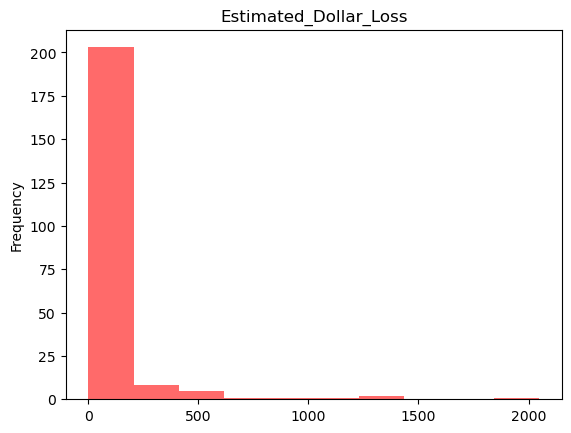

In [129]:
Estimated_Loss = pd.crosstab(index = df7["Estimated_Dollar_Loss_Categorised"], columns = "count")
Estimated_Loss

df7["Estimated_Dollar_Loss"].value_counts().plot(kind = "hist", color = "#FF6A6A", title = "Estimated_Dollar_Loss", xlabel="Loss (in USD)", ylabel="Count of Fires")

col_0,count
Building_Status,
01 - Normal (no change),9797
02 - Under Renovation,482
03 - Under Construction,152
04 - Under Demolition,16
"05 - Abandoned, vacant (long term)",55
08 - Not Applicable,631
09 - Undetermined,83
10 - Missing Entries,4403


<AxesSubplot:title={'center':'Buiilding Status'}, ylabel='Count of Fires'>

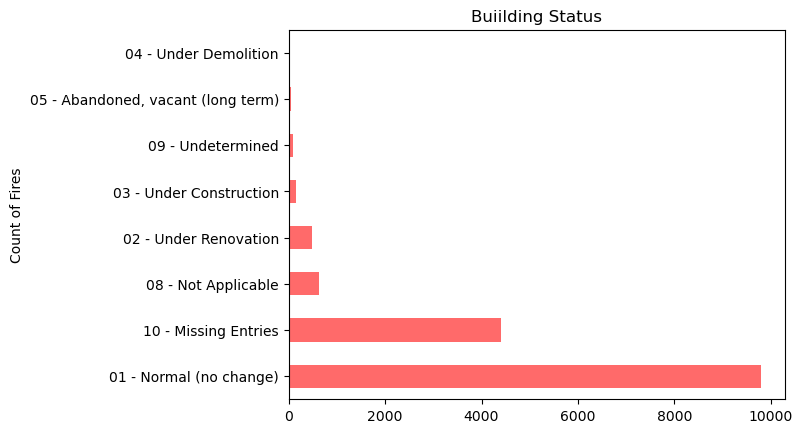

In [130]:
# Frequency table for Building_Status.
Building_Status = pd.crosstab(index = df7["Building_Status"], columns = "count")
Building_Status

# Bar chart for Building Status.
df7["Building_Status"].value_counts().plot(kind = "barh", color = "#FF6A6A", title = "Buiilding Status", xlabel = "Count of Fires", ylabel = "Building Status Type")

col_0,count
Final_Incident_Type,
01 - Fire,15513
"02 - Explosion (including during Fire, excluding Codes 3 & 11-13)",106


<AxesSubplot:title={'center':'Final Incident Type'}, ylabel='Value Count'>

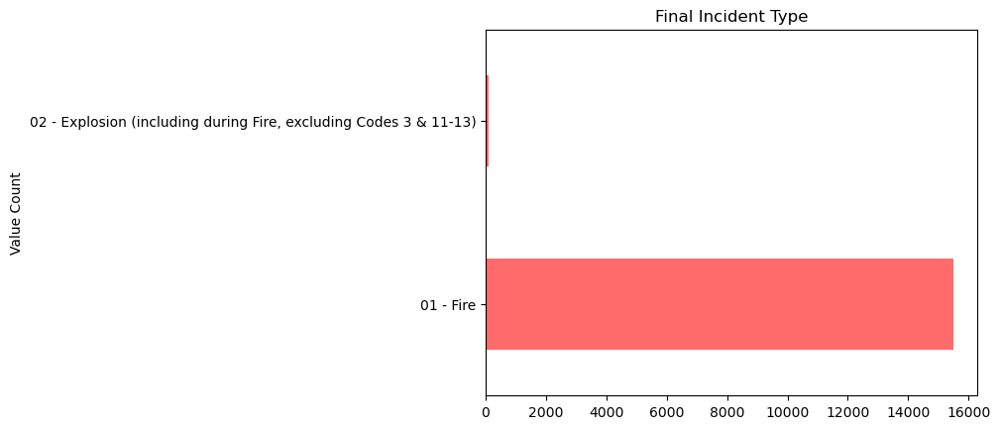

In [131]:
# Frequency table for Final_Incident_Type.
Incident_Type = pd.crosstab(index = df7["Final_Incident_Type"], columns = "count", )
Incident_Type

# Bar chart for Final_Incident_Type.
df7["Final_Incident_Type"].value_counts().plot(kind = "barh", color = "#FF6A6A", title = "Final Incident Type", xlabel = "Value Count", ylabel = "Incident Type")

col_0,count
Area_of_Origin,
"11 - Lobby, Entranceway",87
"12 - Hallway, Corridor",150
"13 - Stairway, Escalator",88
"18 - Covered Court, Atrium, mall concourse",7
19 - Other Means of Egress,14
...,...
92 - Residential/Business: Restaurant area,10
93 - Residential/Business: Other busines area,12
97 - Other - unclassified,418


<AxesSubplot:title={'center':'Area of Origin'}, ylabel='Value Count'>

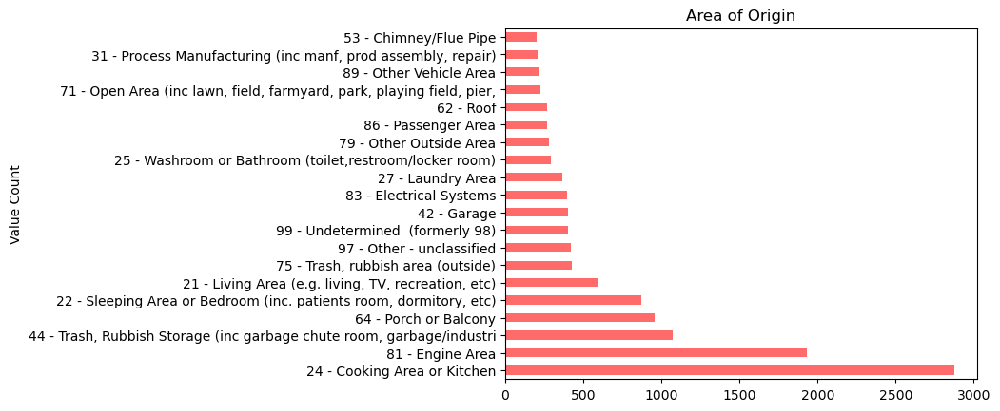

In [132]:
# Frequency table for Area_of_Origin.
Area_of_Fire_Origin = pd.crosstab(index = df7["Area_of_Origin"], columns = "count")
Area_of_Fire_Origin

# Bar chart for top 20 Area_of_Origin.
df7["Area_of_Origin"].value_counts(sort = True).head(20).plot(kind = "barh", color = "#FF6A6A", title = "Area of Origin", xlabel = "Value Count", ylabel = "Area of Origin")

col_0,count
Ignition_Source,
100 - Outdoor fireplace/heater,13
"101 - Exposure, source structure detached",5
"102 - Exposure, source structure semi-detached or attached",4
"103 - Exposure, source outside storage container, tank",4
"104 - Exposure, source open fire (inc campfire, rubbish fire)",20
...,...
"96 - Chemical Reaction (eg. spontaneous combustion, etc.)",112
97 - Rekindle,11
98 - Other,267


<AxesSubplot:title={'center':'Source of Ignition'}, ylabel='Count'>

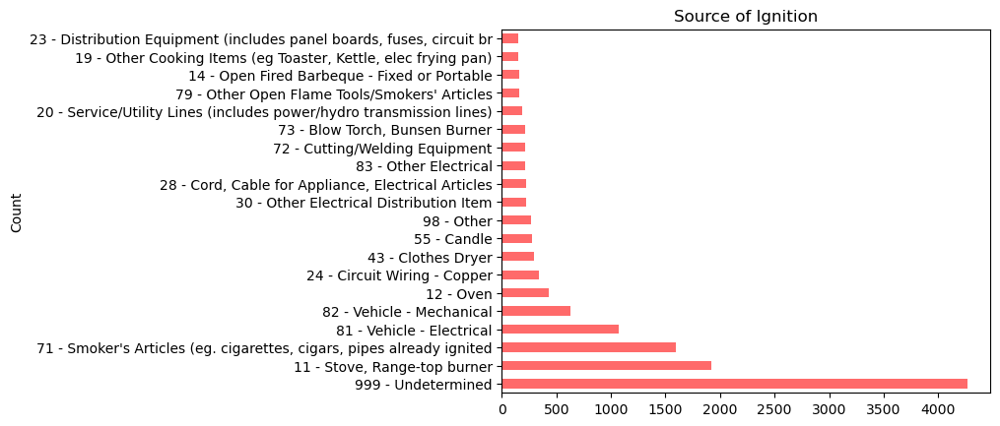

In [133]:
# Frequency table for Ignition_Source.
Source_of_Ignition = pd.crosstab(index = df7["Ignition_Source"], columns = "count")
Source_of_Ignition

# Bar chart for top 20 Ignition_Source.
df7["Ignition_Source"].value_counts(sort = True).head(20).plot(kind = "barh", color = "#FF6A6A", title = "Source of Ignition", ylabel= "Ignition Source Type", xlabel = "Count")

col_0,count
Possible_Cause,
01 - Suspected Arson,205
02 - Riot/Civil Commotion,1
03 - Suspected Vandalism,60
04 - Suspected Youth Vandalism (Ages 12 to 17),17
11 - Children Playing (Ages 11 and under),79
12 - Vehicle Accident/Collision,202
20 - Design/Construction/Installation/Maintenance Deficiency,620
"28 - Routine maintenance deficiency, eg creosote, lint, grease buildup",557
44 - Unattended,1594


<AxesSubplot:title={'center':'Possible Cause of Fire'}, ylabel='Count'>

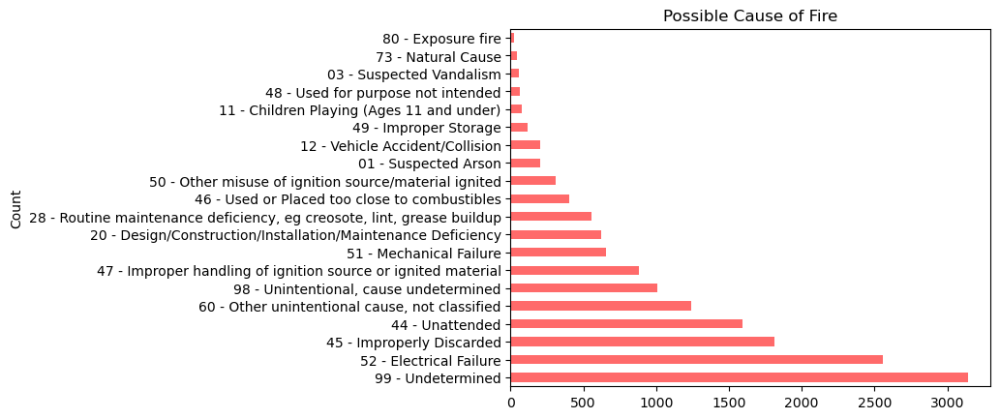

In [134]:
# Frequency table for Possible_Cause.
PossibleCause = pd.crosstab(index = df7["Possible_Cause"], columns = "count")
PossibleCause

# Bar chart for top 20 Possible_Cause.
df7["Possible_Cause"].value_counts(sort = True).head(20).plot(kind = "barh", color = "#FF6A6A", title = "Possible Cause of Fire", xlabel = "Count", ylabel= "Possible Cause")

<AxesSubplot:title={'center':'Material First Ignited'}, ylabel='Count'>

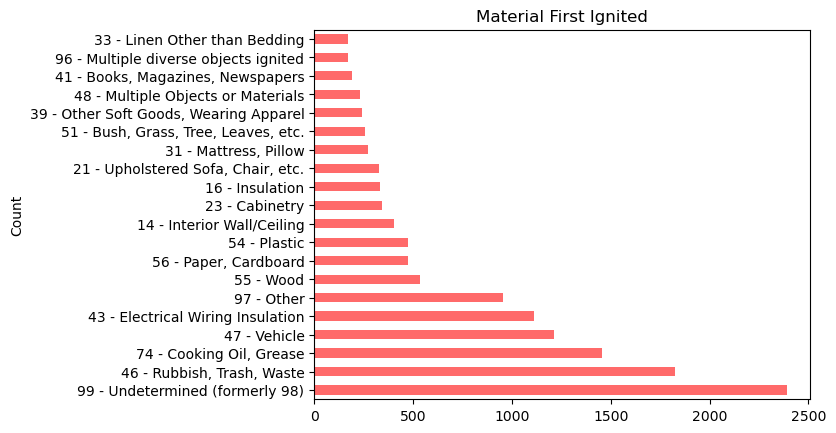

In [135]:
# Bar chart for top 20 Material_First_Ignited.
df7["Material_First_Ignited"].value_counts(sort = True).head(20).plot(kind = "barh", color = "#FF6A6A", title = "Material First Ignited", xlabel = "Count", ylabel= "Material First Ignited Type")

col_0,count
Method_Of_Fire_Control,
1 - Extinguished by fire department,11012
2 - Extinguished by automatic system,505
3 - Extinguished by occupant,3036
4 - Fire self extinguished,704
5 - Action taken unclassified,362


<AxesSubplot:title={'center':'Fire Control Method'}, ylabel='Count of Fires'>

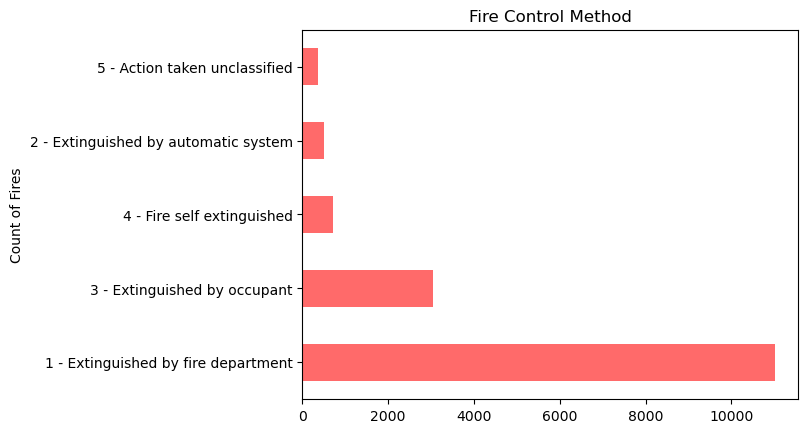

In [136]:
# Frequency table for Method_Of_Fire_Control.
Fire_Control_Method = pd.crosstab(index = df7["Method_Of_Fire_Control"], columns = "count")
Fire_Control_Method

# Bar chart for top 20 Material_First_Ignited.
df7["Method_Of_Fire_Control"].value_counts(sort = True).head(20).plot(kind = "barh", color = "#FF6A6A", title = "Fire Control Method", xlabel = "Count of Fires", ylabel = "Action Type")

col_0,count
Smoke_Alarm_at_Fire_Origin_Alarm_Type,
1 - Battery operated,2380
2 - Hardwired (standalone),2276
3 - Wireless,24
4 - Interconnected,2066
8 - Not applicable - no smoke alarm or presence undetermined,2569
9 - Type undetermined,6304


<AxesSubplot:title={'center':'Type of Smoke Alarm at Fre Origin'}, ylabel='Count of Fires'>

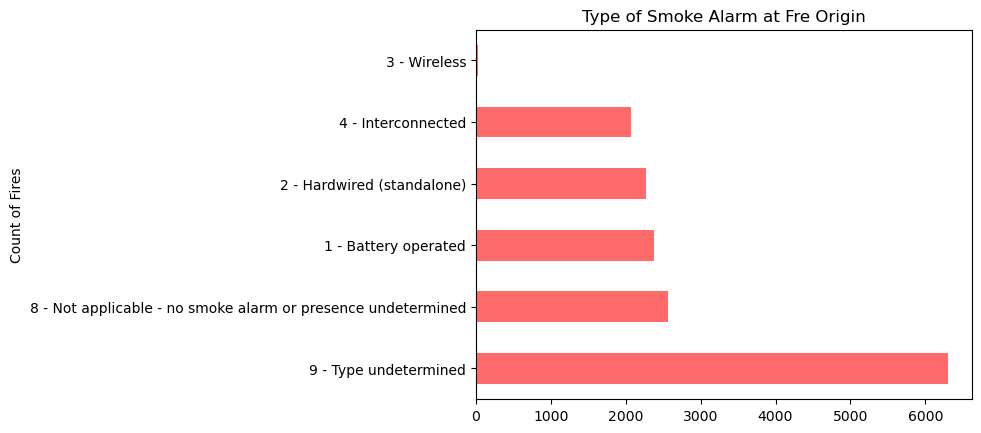

In [137]:
# Frequency table for Smoke_Alarm_at_Fire_Origin_Alarm_Type.
Fire_Alarm_Type = pd.crosstab(index = df7["Smoke_Alarm_at_Fire_Origin_Alarm_Type"], columns = "count")
Fire_Alarm_Type

# Bar chart for top 20 Smoke_Alarm_at_Fire_Origin_Alarm_Type.
df7["Smoke_Alarm_at_Fire_Origin_Alarm_Type"].value_counts(sort = True).head(30).plot(kind = "barh", color = "#FF6A6A", title = "Type of Smoke Alarm at Fre Origin", xlabel = "Count of Fires", ylabel = "Fire Alarm Type")

col_0,count
Status_of_Fire_On_Arrival,
1 - Fire extinguished prior to arrival,3978
2 - Fire with no evidence from street,3041
"3 - Fire with smoke showing only - including vehicle, outdoor fires",3997
"4 - Flames showing from small area (one storey or less, part of a vehicle, outdoor)",2368
"5 - Flames showing from large area (more than one storey, large area outdoors)",355
"7 - Fully involved (total structure, vehicle, spreading outdoor fire)",1531
8 - Exposure involved,52
9 - Unclassified,297


<AxesSubplot:title={'center':'Type of Smoke Alarm at Fire Origin'}, ylabel='Count of Fires'>

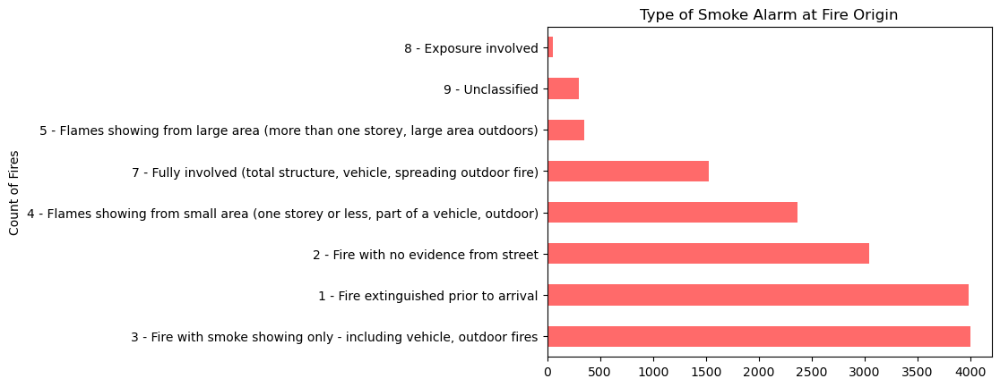

In [138]:
# Frequency table for Status_of_Fire_On_Arrival.
Status_of_Fire = pd.crosstab(index = df7["Status_of_Fire_On_Arrival"], columns = "count")
Status_of_Fire

# Bar chart for top 20 Status_of_Fire_On_Arrival.
df7["Status_of_Fire_On_Arrival"].value_counts(sort = True).head(20).plot(kind = "barh", color = "#FF6A6A", title = "Type of Smoke Alarm at Fire Origin", xlabel = "Count of Fires", ylabel = "Status of Fire")

From the bar charts, we can observe that after the data preparation, many categorical variables are highly skewed, with some variables such as Final_Incident_Type, which have most of the observations under one category. These instances will need to be considered when developing the models.

## Correlation Visualisation

A correlation heatmap is useful to check the correlation between variables. Unappropriate variables such as "_id" and GPS coordinates have been dropped from the heatmap.

<AxesSubplot:>

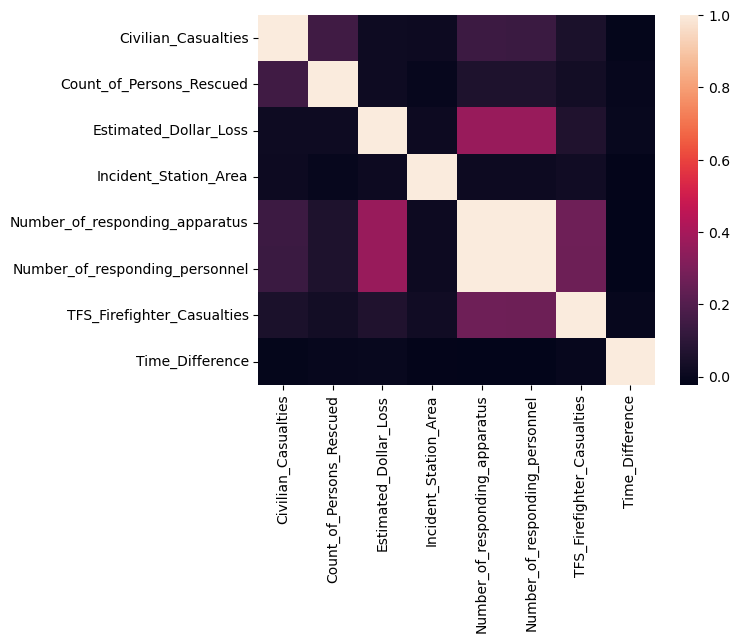

In [139]:
# New sub dataframe without _id and coordinates.
df7_2 = df7.drop(["_id", "Latitude", "Longitude"], axis = 1)

# Plotting heatmap.
correlation = df7_2.corr()
sns.heatmap(correlation)
plt.show()

As observed from the heatmap, the dependent variable "Estimated_Dollar_Loss" has moderate positive correlation with "Number_of_responding_apparatus" and "Number_of_responding_personnel". Intuitevely, as the need for firefighters and resourced to keep a fire incident under control increases, we can infer the extent of the fire incident increases too, leading to a higher loss in economic terms. Moreover, there seems to be a perfect correlation between "Number_of_responding_apparatus" and "Number_of_responding_personnel", which should be considered when running models.

## GPS Coordinates

Our dataset contains GPS Coordinates for each incident. Although these variables cannot be used directly in the predictive model run in this project, location might be an important predictor for the economic loss due to fire incidents. Firstly, we can visualise these coordinates in a scatter plot which resembles the outline of City of Toronto.

<AxesSubplot:title={'center':'Map of Fire Incidents in City of Toronto'}, xlabel='Longitude', ylabel='Latitude'>

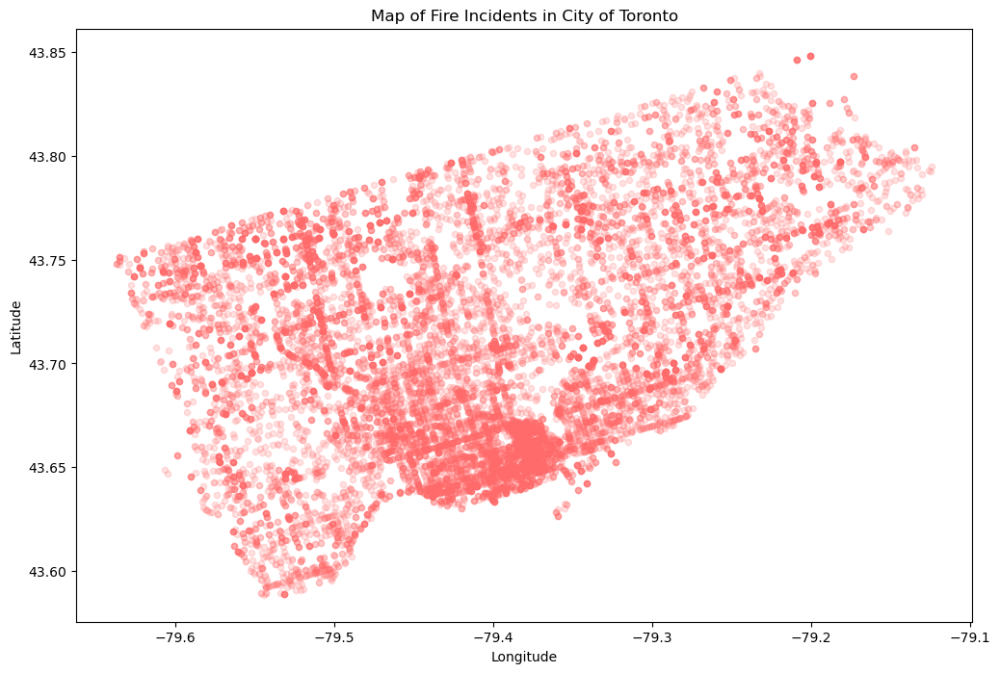

In [140]:
# Scatter plot for GPS coordinates.
df7.plot(kind = "scatter", x = "Longitude", y = "Latitude", alpha = 0.2, figsize = (12,8), color = "#FF6A6A", title = "Map of Fire Incidents in City of Toronto")

To use location as a indepedent variable in our models, we can use clustering. K-Means clustering has been employed to identify 10 clusters of GPS coordinates, which will be then used as categorical independent variables in our predictive models.

KMeans(n_clusters=10)

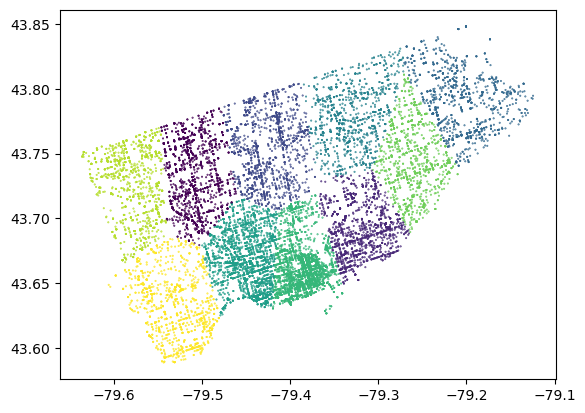

In [141]:
# Create a sub data frame with only GPS Coordinates.
df7_3 = df7.loc[:, "Latitude":"Longitude"]

# Use KMeans to create 10 geographical clusters.
KM = KMeans(10)
KM.fit(df7_3)

# Predict clusters and assign to clusters.
clusters = KM.fit_predict(df7_3)

# Create a new column in our dataset with each cluster.
df8 = df7.copy()
df8['GPS_Cluster'] = clusters

# Visualise the clusters created by KMeans.
plt.scatter(df7['Longitude'], df7['Latitude'], c = df8['GPS_Cluster'], s = 0.2)
plt.show()

# Convert type to category.
df8['GPS_Cluster'] = df8['GPS_Cluster'].astype('category')

# Linear Regression

A linear regression model can be used to estimate a regression with estimated economic loss from fire incidents as the dependent variable, and the other variables as the predictors. Many of the independent variables have to be dropped from the dataset, such as the GPS Coordinates and the ID number. As the dataset contains categorical independent variables, dummies have to be created in order to run the regression model.

## First Linear Regression

In [142]:
df9 = df8.drop(['Latitude', 'Longitude','Incident_Number', 'Final_Incident_Type', 'Estimated_Dollar_Loss_Categorised','Ext_agent_app_or_defer_time','Fire_Under_Control_Time','Intersection','Last_TFS_Unit_Clear_Time'], axis = 1)

# Creating a dummy variable for the variable 'Area_of_Origin' and dropping the first one.
Area_of_Origin = pd.get_dummies(df9['Area_of_Origin'],prefix='Area_of_Origin',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Area_of_Origin],axis=1)

# Creating a dummy variable for the variable 'Building_Status' and dropping the first one.
Building_Status = pd.get_dummies(df9['Building_Status'],prefix='Building_Status',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Building_Status],axis=1)

# Creating a dummy variable for the variable 'Business_Impact' and dropping the first one.
Business_Impact = pd.get_dummies(df9['Business_Impact'],prefix='Business_Impact',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Business_Impact],axis=1)

# Creating a dummy variable for the variable 'Estimated_Number_Of_Persons_Displaced' and dropping the first one.
Estimated_Number_Of_Persons_Displaced = pd.get_dummies(df9['Estimated_Number_Of_Persons_Displaced'],prefix='Estimated_Number_Of_Persons_Displaced',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Estimated_Number_Of_Persons_Displaced],axis=1)

# Creating a dummy variable for the variable 'Extent_Of_Fire' and dropping the first one.
Extent_Of_Fire = pd.get_dummies(df9['Extent_Of_Fire'],prefix='Extent_Of_Fire',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Extent_Of_Fire],axis=1)

# Creating a dummy variable for the variable 'Fire_Alarm_System_Impact_on_Evacuation' and dropping the first one.
Fire_Alarm_System_Impact_on_Evacuation = pd.get_dummies(df9['Fire_Alarm_System_Impact_on_Evacuation'],prefix='Fire_Alarm_System_Impact_on_Evacuation',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Fire_Alarm_System_Impact_on_Evacuation],axis=1)

# Creating a dummy variable for the variable 'Fire_Alarm_System_Operation' and dropping the first one.
Fire_Alarm_System_Operation = pd.get_dummies(df9['Fire_Alarm_System_Operation'],prefix='Fire_Alarm_System_Operation',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Fire_Alarm_System_Operation],axis=1)

# Creating a dummy variable for the variable 'Fire_Alarm_System_Presence' and dropping the first one.
Fire_Alarm_System_Presence = pd.get_dummies(df9['Fire_Alarm_System_Presence'],prefix='Fire_Alarm_System_Presence',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Fire_Alarm_System_Presence],axis=1)

# Creating a dummy variable for the variable 'Ignition_Source' and dropping the first one.
Ignition_Source = pd.get_dummies(df9['Ignition_Source'],prefix='Ignition_Source',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Ignition_Source],axis=1)

# Creating a dummy variable for the variable 'Incident_Station_Area' and dropping the first one.
Incident_Station_Area = pd.get_dummies(df9['Incident_Station_Area'],prefix='Incident_Station_Area',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Incident_Station_Area],axis=1)

# Creating a dummy variable for the variable 'Incident_Ward' and dropping the first one.
Incident_Ward = pd.get_dummies(df9['Incident_Ward'],prefix='Incident_Ward',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Incident_Ward],axis=1)

# Creating a dummy variable for the variable 'Initial_CAD_Event_Type' and dropping the first one.
Initial_CAD_Event_Type = pd.get_dummies(df9['Initial_CAD_Event_Type'],prefix='Initial_CAD_Event_Type',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Initial_CAD_Event_Type],axis=1)

# Creating a dummy variable for the variable 'Material_First_Ignited' and dropping the first one.
Material_First_Ignited = pd.get_dummies(df9['Material_First_Ignited'],prefix='Material_First_Ignited',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Material_First_Ignited],axis=1)

# Creating a dummy variable for the variable 'Method_Of_Fire_Control' and dropping the first one.
Method_Of_Fire_Control = pd.get_dummies(df9['Method_Of_Fire_Control'],prefix='Method_Of_Fire_Control',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Method_Of_Fire_Control],axis=1)

# Creating a dummy variable for the variable 'Possible_Cause' and dropping the first one.
Possible_Cause = pd.get_dummies(df9['Possible_Cause'],prefix='Possible_Cause',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Possible_Cause],axis=1)

# Creating a dummy variable for the variable 'Property_Use' and dropping the first one.
Property_Use = pd.get_dummies(df9['Property_Use'],prefix='Property_Use',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Property_Use],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_at_Fire_Origin' and dropping the first one.
Smoke_Alarm_at_Fire_Origin = pd.get_dummies(df9['Smoke_Alarm_at_Fire_Origin'],prefix='Smoke_Alarm_at_Fire_Origin',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Smoke_Alarm_at_Fire_Origin],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_at_Fire_Origin_Alarm_Failure' and dropping the first one.
Smoke_Alarm_at_Fire_Origin_Alarm_Failure = pd.get_dummies(df9['Smoke_Alarm_at_Fire_Origin_Alarm_Failure'],prefix='Smoke_Alarm_at_Fire_Origin_Alarm_Failure',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Smoke_Alarm_at_Fire_Origin_Alarm_Failure],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_at_Fire_Origin_Alarm_Type' and dropping the first one.
Smoke_Alarm_at_Fire_Origin_Alarm_Type = pd.get_dummies(df9['Smoke_Alarm_at_Fire_Origin_Alarm_Type'],prefix='Smoke_Alarm_at_Fire_Origin_Alarm_Type',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Smoke_Alarm_at_Fire_Origin_Alarm_Type],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation' and dropping the first one.
Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation = pd.get_dummies(df9['Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation'],prefix='Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation],axis=1)

# Creating a dummy variable for the variable 'Smoke_Spread' and dropping the first one.
Smoke_Spread = pd.get_dummies(df9['Smoke_Spread'],prefix='Smoke_Spread',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Smoke_Spread],axis=1)

# Creating a dummy variable for the variable 'Sprinkler_System_Operation' and dropping the first one.
Sprinkler_System_Operation = pd.get_dummies(df9['Sprinkler_System_Operation'],prefix='Sprinkler_System_Operation',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Sprinkler_System_Operation],axis=1)

# Creating a dummy variable for the variable 'Sprinkler_System_Presence' and dropping the first one.
Sprinkler_System_Presence = pd.get_dummies(df9['Sprinkler_System_Presence'],prefix='Sprinkler_System_Presence',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Sprinkler_System_Presence],axis=1)

# Creating a dummy variable for the variable 'Status_of_Fire_On_Arrival' and dropping the first one.
Status_of_Fire_On_Arrival = pd.get_dummies(df9['Status_of_Fire_On_Arrival'],prefix='Status_of_Fire_On_Arrival',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,Status_of_Fire_On_Arrival],axis=1)

# Creating a dummy variable for the variable 'GPS_Cluster' and dropping the first one.
GPS_Cluster = pd.get_dummies(df9['GPS_Cluster'],prefix='GPS_Cluster',drop_first=True)
#Adding the results to the master dataframe
df9 = pd.concat([df9,GPS_Cluster],axis=1)

# Drop the original variables.
df10 = df9.drop(['_id','Area_of_Origin','Building_Status','Business_Impact','Estimated_Number_Of_Persons_Displaced','Extent_Of_Fire', 'Fire_Alarm_System_Impact_on_Evacuation','Fire_Alarm_System_Operation','Fire_Alarm_System_Presence','Ignition_Source','Incident_Station_Area','Incident_Ward','Initial_CAD_Event_Type','Material_First_Ignited','Method_Of_Fire_Control','Possible_Cause','Property_Use','Smoke_Alarm_at_Fire_Origin','Smoke_Alarm_at_Fire_Origin_Alarm_Failure','Smoke_Alarm_at_Fire_Origin_Alarm_Type','Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation','Smoke_Spread','Sprinkler_System_Operation','Sprinkler_System_Presence','Status_of_Fire_On_Arrival'], axis=1)

In [143]:
# Splitting training and testing sets.
X = df10.drop('Estimated_Dollar_Loss', axis=1).values
y = df10['Estimated_Dollar_Loss'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, test_size = 0.2, shuffle = True)

In [144]:
# Fit linear regression model.
lr1 = sm.OLS(y_train, X_train).fit()

# Create a list with coefficient names.
coefficient_names = df10.columns.tolist()
coefficient_names.remove("Estimated_Dollar_Loss")

# Use predict.
lr1_y_pred = lr1.predict(X_test)

In [145]:
# Print the accuracy.
print("First linear regression model accuracy: {:.2f}".format(lr1.rsquared))

First linear regression model accuracy: 0.40


The first linear regression model return an $R^2$ of 0.40, which means 40% of the variability is explained by the model. In order to improve the accuracy of the model, we can look at the assumptions made for this first regression.

Firstly, we have assumed there is a lin-lin relationship between the predictors and the dependent variable. Using skewness, we can check the asymmetry of the variables. 

Secondly, we have included both "Number_of_responding_personnel" and "Number_of_responding_apparatus" in our regression. From the variable heatmap shown previously in the EDA, we can observe how the these two variables have a strong positive correlation. Inclusing these two variables violate the assumption of no perfect multicollinearity between independent variables. Hence, we expect that by not including one of these variables, the degree of multicollinearity in our regression should decrease.

Therefore, a second linear regression model will be run with these observations taken into consideration.

## Second Linear Regression

We can test for skewness.

In [146]:
# Testing the skewness of the continuous variables.
df8.drop(["_id", "Incident_Station_Area", "Latitude", "Longitude"], axis = 1).skew(numeric_only = True)

Civilian_Casualties                9.691473
Count_of_Persons_Rescued          74.007854
Estimated_Dollar_Loss             88.439465
Number_of_responding_apparatus    14.665865
Number_of_responding_personnel    13.525164
TFS_Firefighter_Casualties        12.112583
Time_Difference                   92.991034
dtype: float64

As observed, all of the continuous variables have high skewness, to mitigate this problem, we can take the logs of these variables to run a log-log regression.

In [147]:
# New data frame to not override the original dataset.
df11 = df8.copy()

# Use Numpy's log1p to log(x+1), where x is the variable.
df11["Estimated_Dollar_Loss"] = np.log1p(df11["Estimated_Dollar_Loss"])
df11["Civilian_Casualties"] = np.log1p(df11["Civilian_Casualties"])
df11["Count_of_Persons_Rescued"] = np.log1p(df11["Count_of_Persons_Rescued"])
df11["Number_of_responding_apparatus"] = np.log1p(df11["Number_of_responding_apparatus"])
df11["Number_of_responding_personnel"] = np.log(df11["Number_of_responding_personnel"])
df11["Time_Difference"] = np.log1p(df11["Time_Difference"])
df11["TFS_Firefighter_Casualties"] = np.log1p(df11["TFS_Firefighter_Casualties"])

# Testing the skewness of the continuous variables after taking logs.
df11.drop(["_id", "Incident_Station_Area", "Latitude", "Longitude"], axis = 1).skew(numeric_only = True)

Civilian_Casualties                4.448073
Count_of_Persons_Rescued          10.461469
Estimated_Dollar_Loss             -0.804670
Number_of_responding_apparatus    -0.082444
Number_of_responding_personnel    -0.447439
TFS_Firefighter_Casualties         9.761605
Time_Difference                   30.162486
dtype: float64

As observed, the skewness of the variables is reduced significantly. Then, we drop "Number_of_responding_apparatus" to reduce multicollinearity, and all the other indepedent variables that are redundant when running the regression. We create new dummies as df12, which contains the logged continuous variables, does not include the dummies for the categorical variables.

In [148]:
df12 = df11.drop(['Latitude', 'Longitude','Incident_Number','Final_Incident_Type','Estimated_Dollar_Loss_Categorised','Ext_agent_app_or_defer_time','Fire_Under_Control_Time','Intersection','Last_TFS_Unit_Clear_Time'], axis=1)

# Creating a dummy variable for the variable 'Area_of_Origin' and dropping the first one.
Area_of_Origin = pd.get_dummies(df12['Area_of_Origin'],prefix='Area_of_Origin',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Area_of_Origin],axis=1)

# Creating a dummy variable for the variable 'Building_Status' and dropping the first one.
Building_Status = pd.get_dummies(df12['Building_Status'],prefix='Building_Status',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Building_Status],axis=1)

# Creating a dummy variable for the variable 'Business_Impact' and dropping the first one.
Business_Impact = pd.get_dummies(df12['Business_Impact'],prefix='Business_Impact',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Business_Impact],axis=1)

# Creating a dummy variable for the variable 'Estimated_Number_Of_Persons_Displaced' and dropping the first one.
Estimated_Number_Of_Persons_Displaced = pd.get_dummies(df12['Estimated_Number_Of_Persons_Displaced'],prefix='Estimated_Number_Of_Persons_Displaced',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Estimated_Number_Of_Persons_Displaced],axis=1)

# Creating a dummy variable for the variable 'Extent_Of_Fire' and dropping the first one.
Extent_Of_Fire = pd.get_dummies(df12['Extent_Of_Fire'],prefix='Extent_Of_Fire',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Extent_Of_Fire],axis=1)

# Creating a dummy variable for the variable 'Fire_Alarm_System_Impact_on_Evacuation' and dropping the first one.
Fire_Alarm_System_Impact_on_Evacuation = pd.get_dummies(df12['Fire_Alarm_System_Impact_on_Evacuation'],prefix='Fire_Alarm_System_Impact_on_Evacuation',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Fire_Alarm_System_Impact_on_Evacuation],axis=1)

# Creating a dummy variable for the variable 'Fire_Alarm_System_Operation' and dropping the first one.
Fire_Alarm_System_Operation = pd.get_dummies(df12['Fire_Alarm_System_Operation'],prefix='Fire_Alarm_System_Operation',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Fire_Alarm_System_Operation],axis=1)

# Creating a dummy variable for the variable 'Fire_Alarm_System_Presence' and dropping the first one.
Fire_Alarm_System_Presence = pd.get_dummies(df12['Fire_Alarm_System_Presence'],prefix='Fire_Alarm_System_Presence',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Fire_Alarm_System_Presence],axis=1)

# Creating a dummy variable for the variable 'Ignition_Source' and dropping the first one.
Ignition_Source = pd.get_dummies(df12['Ignition_Source'],prefix='Ignition_Source',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Ignition_Source],axis=1)

# Creating a dummy variable for the variable 'Incident_Station_Area' and dropping the first one.
Incident_Station_Area = pd.get_dummies(df12['Incident_Station_Area'],prefix='Incident_Station_Area',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Incident_Station_Area],axis=1)

# Creating a dummy variable for the variable 'Incident_Ward' and dropping the first one.
Incident_Ward = pd.get_dummies(df12['Incident_Ward'],prefix='Incident_Ward',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Incident_Ward],axis=1)

# Creating a dummy variable for the variable 'Initial_CAD_Event_Type' and dropping the first one.
Initial_CAD_Event_Type = pd.get_dummies(df12['Initial_CAD_Event_Type'],prefix='Initial_CAD_Event_Type',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Initial_CAD_Event_Type],axis=1)

# Creating a dummy variable for the variable 'Material_First_Ignited' and dropping the first one.
Material_First_Ignited = pd.get_dummies(df12['Material_First_Ignited'],prefix='Material_First_Ignited',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Material_First_Ignited],axis=1)

# Creating a dummy variable for the variable 'Method_Of_Fire_Control' and dropping the first one.
Method_Of_Fire_Control = pd.get_dummies(df12['Method_Of_Fire_Control'],prefix='Method_Of_Fire_Control',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Method_Of_Fire_Control],axis=1)

# Creating a dummy variable for the variable 'Possible_Cause' and dropping the first one.
Possible_Cause = pd.get_dummies(df12['Possible_Cause'],prefix='Possible_Cause',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Possible_Cause],axis=1)

# Creating a dummy variable for the variable 'Property_Use' and dropping the first one.
Property_Use = pd.get_dummies(df12['Property_Use'],prefix='Property_Use',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Property_Use],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_at_Fire_Origin' and dropping the first one.
Smoke_Alarm_at_Fire_Origin = pd.get_dummies(df12['Smoke_Alarm_at_Fire_Origin'],prefix='Smoke_Alarm_at_Fire_Origin',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Smoke_Alarm_at_Fire_Origin],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_at_Fire_Origin_Alarm_Failure' and dropping the first one.
Smoke_Alarm_at_Fire_Origin_Alarm_Failure = pd.get_dummies(df12['Smoke_Alarm_at_Fire_Origin_Alarm_Failure'],prefix='Smoke_Alarm_at_Fire_Origin_Alarm_Failure',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Smoke_Alarm_at_Fire_Origin_Alarm_Failure],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_at_Fire_Origin_Alarm_Type' and dropping the first one.
Smoke_Alarm_at_Fire_Origin_Alarm_Type = pd.get_dummies(df12['Smoke_Alarm_at_Fire_Origin_Alarm_Type'],prefix='Smoke_Alarm_at_Fire_Origin_Alarm_Type',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Smoke_Alarm_at_Fire_Origin_Alarm_Type],axis=1)

# Creating a dummy variable for the variable 'Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation' and dropping the first one.
Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation = pd.get_dummies(df12['Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation'],prefix='Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation],axis=1)

# Creating a dummy variable for the variable 'Smoke_Spread' and dropping the first one.
Smoke_Spread = pd.get_dummies(df12['Smoke_Spread'],prefix='Smoke_Spread',drop_first=True)
#Adding the results to the master dataframe
df12= pd.concat([df9,Smoke_Spread],axis=1)

# Creating a dummy variable for the variable 'Sprinkler_System_Operation' and dropping the first one.
Sprinkler_System_Operation = pd.get_dummies(df12['Sprinkler_System_Operation'],prefix='Sprinkler_System_Operation',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Sprinkler_System_Operation],axis=1)

# Creating a dummy variable for the variable 'Sprinkler_System_Presence' and dropping the first one.
Sprinkler_System_Presence = pd.get_dummies(df12['Sprinkler_System_Presence'],prefix='Sprinkler_System_Presence',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Sprinkler_System_Presence],axis=1)

# Creating a dummy variable for the variable 'Status_of_Fire_On_Arrival' and dropping the first one.
Status_of_Fire_On_Arrival = pd.get_dummies(df12['Status_of_Fire_On_Arrival'],prefix='Status_of_Fire_On_Arrival',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,Status_of_Fire_On_Arrival],axis=1)

# Creating a dummy variable for the variable 'GPS_Cluster' and dropping the first one.
GPS_Cluster = pd.get_dummies(df12['GPS_Cluster'],prefix='GPS_Cluster',drop_first=True)
#Adding the results to the master dataframe
df12 = pd.concat([df12,GPS_Cluster],axis=1)

# Drop the original variables.
df13 = df12.drop(['_id','Area_of_Origin', 'Number_of_responding_apparatus', 'Building_Status','Business_Impact','Estimated_Number_Of_Persons_Displaced','Extent_Of_Fire','Fire_Alarm_System_Impact_on_Evacuation','Fire_Alarm_System_Operation','Fire_Alarm_System_Presence','Ignition_Source','Incident_Station_Area','Incident_Ward','Initial_CAD_Event_Type','Material_First_Ignited','Method_Of_Fire_Control','Possible_Cause','Property_Use','Smoke_Alarm_at_Fire_Origin','Smoke_Alarm_at_Fire_Origin_Alarm_Failure','Smoke_Alarm_at_Fire_Origin_Alarm_Type','Smoke_Alarm_Impact_on_Persons_Evacuating_Impact_on_Evacuation','Smoke_Spread','Sprinkler_System_Operation','Sprinkler_System_Presence','Status_of_Fire_On_Arrival'], axis=1)

In [149]:
# Splitting training and testing sets.
X_2 = df13.drop('Estimated_Dollar_Loss', axis=1).values
y_2 = df13['Estimated_Dollar_Loss'].values
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, train_size = 0.8, test_size = 0.2, shuffle = True)

# Fit linear regression model.
lr2 = sm.OLS(y_train_2, X_train_2).fit()

# Create a list with coefficient names.
coefficient_names_2 = df13.columns.tolist()
coefficient_names_2.remove("Estimated_Dollar_Loss")

# Use predict.
lr2_y_pred = lr2.predict(X_test_2)

# Print model summary.
print(lr2.summary(xname = coefficient_names_2))

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.443
Model:                            OLS   Adj. R-squared:                  0.403
Method:                 Least Squares   F-statistic:                     11.02
Date:                Sun, 11 Dec 2022   Prob (F-statistic):               0.00
Time:                        21:45:44   Log-Likelihood:            -1.7819e+05
No. Observations:               12495   AIC:                         3.581e+05
Df Residuals:                   11652   BIC:                         3.643e+05
Df Model:                         842                                         
Covariance Type:            nonrobust                                         
                                                                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
---------

In [165]:
# Print the R squared.
print("First linear regression R squared: {:.2f}".format(lr1.rsquared))
print("Second linear regression R squared: {:.2f}".format(lr2.rsquared))

First linear regression R squared: 0.40
Second linear regression R squared: 0.44


Although in the second linear regression model, where we have used logs to mitigate the skewness problem of the continuous variables, and an independent variable that had high correlation with another variable has been dropped, the $R^2$ only improves by 4%.

In [151]:
# Print the RMSE for the linear regressions.
print("The RMSE for the linear regression model using original data is: {:.2f}".format(np.sqrt(mean_squared_error(y_test, lr1_y_pred))))
print("The RMSE for the linear regression model using log transformed data is: {:.2f}".format(np.sqrt(mean_squared_error(y_test_2, lr2_y_pred))))

The RMSE for the linear regression model using original data is: 855253.69
The RMSE for the linear regression model using log transformed data is: 235529.73


The RMSE for the second linear regression model improves significantly, but it's still very high. To improve the accuracy of our predictions, we could look at other types of regression models. XGBoost dominates structured datasets on regression predictive modeling problems, increasing efficiency (Brownlee, 2021).

# Additional Regression Models

Apart from linear regression, two additional regression models have been employed in this project.

## Support Vector Machine

Rather than attempting to minimize the discrepancy between the actual and predicted values like linear regression models, Support Vector Machine (SVM) regression seeks to fit the best line within a given margin of error (Raj, 2020). We can compare the RMSE of two SVM regressions. Firstly, the original dataset will be used with no log tranformation. In the second regression, we will use the continuous variables with log transformed data.

In [110]:
# Run SVM regression using data used for the first regression.
regressor = SVR(kernel = 'rbf')
regressor.fit(X_train, y_train)
y_pred_svr = regressor.predict(X_test)
score_train = np.sqrt(mean_squared_error(y_test, y_pred_svr))

SVR()

In [113]:
# Run SVM regression using data used for the second regression (logged continuous variables).
regressor_2 = SVR(kernel = 'rbf')
regressor_2.fit(X_train_2, y_train_2)
y_pred_svr_2 = regressor_2.predict(X_test_2)
score_train_2 = np.sqrt(mean_squared_error(y_test_2, y_pred_svr_2))

SVR()

In [161]:
# Print the RMSE for the SVM regressions.
print("The RMSE for the SVM regression model using original data is: {:.2f}".format(score_train))
print("The RMSE for the SVM regression model using log transformed data is: {:.2f}".format(score_train_2))

The RMSE for the SVM regression model using original data is: 193481.31
The RMSE for the SVM regression model using log transformed data is: 143330.62


## Extreme Gradient Boosting

XGBoost is a relatively new algorithm which performs well on medium-sized data with subgroups and structured datasets (Hachcham, 2022). We can compare the RMSE of two XGBoost regressions. Firstly, the original dataset will be used with no log tranformation. In the second regression, we will use the continuous variables with log transformed data.

In [152]:
# Run XGBoost using data used for the first regression.
data_dmatrix = xgb.DMatrix(data = X_train, label = y_train)
xg_reg = xgb.XGBRegressor(objective ='reg:linear', eval_metric = "rmsle")
xg_reg.fit(X_train,y_train)
preds = xg_reg.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, preds))

[21:49:25] WARNING: ../src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric='rmsle', feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, objective='reg:linear', predictor='auto', ...)

In [156]:
# Run XGBoost using data used for the second regression (logged continuous variables).
data_dmatrix_2 = xgb.DMatrix(data = X_train_2, label = y_train_2)
xg_reg_2 = xgb.XGBRegressor(objective = 'reg:linear', eval_metric = "rmsle")
xg_reg_2.fit(X_train_2,y_train_2)
preds_2 = xg_reg_2.predict(X_test_2)
rmse_2 = np.sqrt(mean_squared_error(y_test_2, preds_2))

[21:50:19] WARNING: ../src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric='rmsle', feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, objective='reg:linear', predictor='auto', ...)

In [157]:
# Print the RMSE for the XGBoost regressions.
print("The RMSE for the XGBoost using original data is: {:.2f}".format(rmse))
print("The RMSE for the XGBoost using log transformed data is: {:.2f}".format(rmse_2))

The RMSE for the XGBoost using original data is: 833931.98
The RMSE for the XGBoost using log transformed data is: 185145.92


The RMSE for both models is high, however, the RMSE for the XGBoost regression using the log transformed data is lower. This is because the log transformation reduces the impact of large errors, which can lead to a decrease in RMSE.

In [158]:
# Print the RMSE for the regressions.
print("The RMSE for the linear regression model using original data is: {:.2f}".format(np.sqrt(mean_squared_error(y_test, lr1_y_pred))))
print("The RMSE for the linear regression model using log transformed data is: {:.2f}".format(np.sqrt(mean_squared_error(y_test_2, lr2_y_pred))))
print("The RMSE for the SVM regression model using original data is: {:.2f}".format(score_train))
print("The RMSE for the SVM regression model using log transformed data is: {:.2f}".format(score_train_2))
print("The RMSE for the XGBoost using original data is: {:.2f}".format(rmse))
print("The RMSE for the XGBoost using log transformed data is: {:.2f}".format(rmse_2))

The RMSE for the linear regression model using original data is: 855253.69
The RMSE for the linear regression model using log transformed data is: 235529.73
The RMSE for the SVM regression model using original data is: 193481.31
The RMSE for the SVM regression model using log transformed data is: 143330.62
The RMSE for the XGBoost using original data is: 833931.98
The RMSE for the XGBoost using log transformed data is: 185145.92


We can observe that in all the models employed in this project, the RMSE decreases when:
<br> 1. "Number_of_responding_apparatus" is removed to decrease multicollinearity.
<br> 2. Continuous variables including the dependent variable are long transformed.
<br>This emphasises the importance of fitting the right data and checking for multicollinearity and skewness in our dataset before running models. However, looking at the RMSE's from our models, we would expect the accuracy of the XGBoost to be higher than the accuracy of the SVM regression. A possible reason for the low accuracy could be that XGBoost is more likely than SVM regression to overfit. Moroever, XGBoost is sensitive to hyperparameter adjustment, therefore if the parameters are not tuned properly, the accuracy decreases.

## Conclusions

To find the most important predictor for the economic loss from a fire incident from our dataset, we will use the model summary from the second linear regression model. Firstly, we can create a table with the lowest 50 p-values from our regression.

In [159]:
# Assign the summary from the second linear regression.
lr2_summary = lr2.summary(xname = coefficient_names_2)

# Create a table from the summary.
lr2_table = pd.DataFrame(lr2_summary.tables[1].data[1:], columns=lr2_summary.tables[1].data[0])

# Sort the table by descending p-values.
lr2_table_sortedp = lr2_table.sort_values(by ='P>|t|', ascending = True).head(50)
lr2_table_sortedp

,,coef,std err,t,P>|t|,[0.025,0.975]
682,Property_Use_645 - Mfg: Dry Cleaning Plant,4.124e+06,3.02e+05,13.643,0.000,3.53e+06,4.72e+06
521,Possible_Cause_990 - Under Investigation,3.482e+06,1.6e+05,21.706,0.000,3.17e+06,3.8e+06
573,Property_Use_217 - Infirmary,-2.997e+06,4.71e+05,-6.361,0.000,-3.92e+06,-2.07e+06
659,Property_Use_612 - Hydro Distribution Facility,4.996e+05,1.31e+05,3.825,0.000,2.44e+05,7.56e+05
89,Business_Impact_5 - May not resume operations,5.179e+05,6.05e+04,8.561,0.000,3.99e+05,6.37e+05
647,"Property_Use_535 - Computer/electronics store,...",1.337e+06,2.56e+05,5.224,0.000,8.35e+05,1.84e+06
485,"Material_First_Ignited_79 - Other Flammable, C...",2.743e+05,7.39e+04,3.711,0.000,1.29e+05,4.19e+05
494,Material_First_Ignited_990 - Under Investigation,3.927e+06,2.09e+05,18.792,0.000,3.52e+06,4.34e+06
423,Initial_CAD_Event_Type_VEF,4.273e+05,1.22e+05,3.507,0.000,1.88e+05,6.66e+05
77,Area_of_Origin_990 - Under Investigation,4.307e+06,2.15e+05,20.066,0.000,3.89e+06,4.73e+06


We can observe from the results of the second linear regression that the most important predictor that is statiscally significant is the number of responding personnel. The interpretation is as follows: ceteris paribus, for every % increase in the number of responding personnel in a fire incident, the economic loss increases by 7568.43%. However, this rises a question of reverse causality which should be analysed further in the future. Reverse causality is an issue in regression because it can lead to incorrect conclusions about the relationship between two variables.

# Limitations

This machine learning project has several limitations that should be accounted for when interpreting the results. Firstly, the data used in this project is limited to incidents in Toronto, which may not be representative of fire incidents in other places. Secondly, the data used in this project is limited to economic losses, which may not be representative of other types of losses associated with fire incidents. Thirdly, the models used in this project are limited to regressions, which have not yielded high accuracies which enable future predictions. Further analysis should be conducted to identify additional factors that may influence economic losses associated with fire incidents in order to reduce the MSE of the models. This could include investigating the effects of weather, building characteristics, and other environmental factors. Furthermore, more sophisticated machine learning techniques such as neural networks and decision trees should be investigated to improve model accuracy. Moreover, data from other cities should be included in the analysis to ensure that the findings are transferable to other locations. To reduce the problem of reverse causality, instrumental variables could be assessed to identify the direction of causality by introducing a third variable that is correlated with the independent variable, but not with the dependent variable. In this case, a third variable could be used that is correlated with the number of personnel, but not with the economic loss of a fire incident, such as the budget of fire stations.

Overall, this project provides a useful starting point for understanding the economic losses associated with fire incidents. However, further research is needed to improve the accuracy of the models and to better understand the factors that influence economic losses associated with fire incidents. 

# References

Brownlee, J. (2021). ‘XGBoost for Regression’. Available at: https://machinelearningmastery.com/xgboost-for-regression/ (Accessed: 10 December 2022).

Boisvert, N. (2021). ‘Toronto Fire, busy and understaffed during COVID-19, eyes growth in 2021’. Available at: https://www.cbc.ca/news/canada/toronto/toronto-fire-2021-budget-1.5866606(Accessed: 25 November 2022).

Ckan. (2022). ‘Fire Incidents, electronic dataset’. Available at: (Accessed: 5 November 2022).

Douglas, P. (2016). ‘Human cost of house fires has $7.6 billion impact on Canadian economy’. Available at: https://www.oafc.on.ca/article/human-cost-house-fires-has-76-billion-impact-canadian-economy (Accessed: 25 November 2022).

Gandhi, R. (2018). ‘Support Vector Machine — Introduction to Machine Learning Algorithms’. Available at: https://towardsdatascience.com/support-vector-machine-introduction-to-machine-learning-algorithms-934a444fca47(Accessed: 10 December 2022).

Hachcham, A. (2022). ‘XGBoost: Everything You Need to Know’. Available at: https://neptune.ai/blog/xgboost-everything-you-need-to-know (Accessed: 11 December 2022).

NFCC. (2019). ‘Arson’. Available at: https://universitas21.com/get-involved/networking-groups/u21-international-fire-safety-consortium/background-addressing (Accessed: 25 November 2022).

Raj, A. (2020). ‘Unlocking the True Power of Support Vector Regression’. Available at: https://towardsdatascience.com/unlocking-the-true-power-of-support-vector-regression-847fd123a4a0 (Accessed: 11 December 2022).

UNIVERSITAS21. (no date). ‘Background: Addressing Today’s Most Urgent Global Fire Safety Needs’. Available at: https://universitas21.com/get-involved/networking-groups/u21-international-fire-safety-consortium/background-addressing (Accessed: 25 November 2022).

# Appendix

## Attribution Statement and Project Management

### Attribution Statement

The connection starts long before the group work starts; special thanks to our TA Saraansh Arya who pulled us together with regular weekly meetinsg from the beginning of the term. We had 11 group meetups and 4 meetings with TA (excluding meetings during class and TA drop-off hours). Starting from dataset research, all group members contributed more than three different datasets, and considering the cleanliness, data sufficiency, data updated degree, and the interesting level of the prediction topic, the Toronto Fire Incidents Data provided by Ching-Yu was selected. Afterwards, Viren took the responsibility of data cleaning, Rachel took on the regression, Bhakti was in charge of the exploratory data analysis, and Ching-Yu for managing Trello. Viren, Rachel, and Bhakti finished the model running of linear regression, SVM regressor, and XGBoost, including the model selection and troubleshooting. Ching-Yu and Viren structured and finalised the final report with all merging and markdowns. Finally, this report will not be done without the advice and suggestions from David and Saraansh.

### Project Management

Trello was used as a project management tool. Please find attached four screenshots of the Trello board corresponding to four different weeks, and two calendar screenshots.

#### Weekly Trello Boards

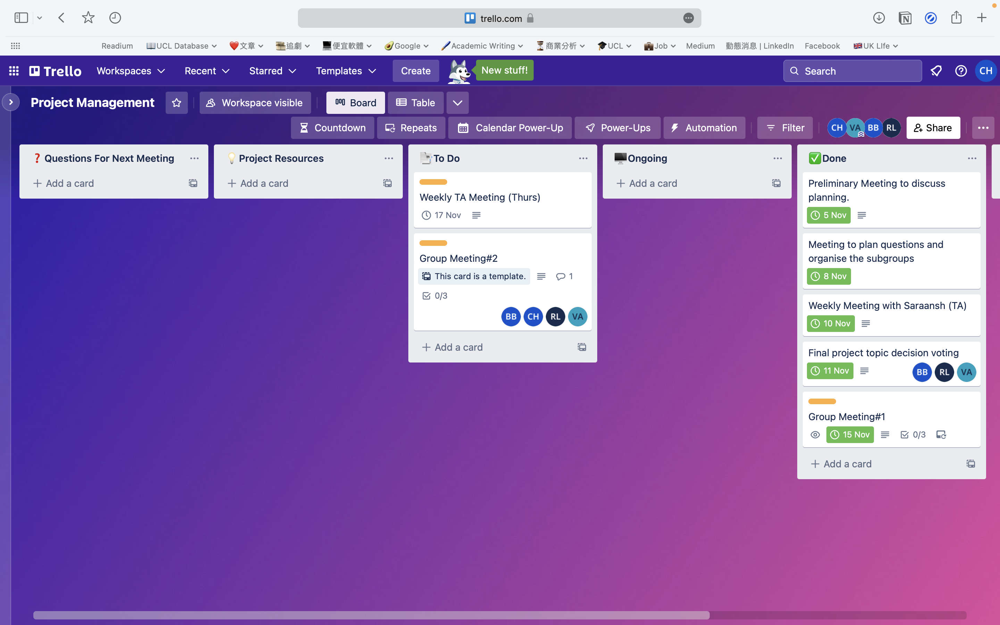

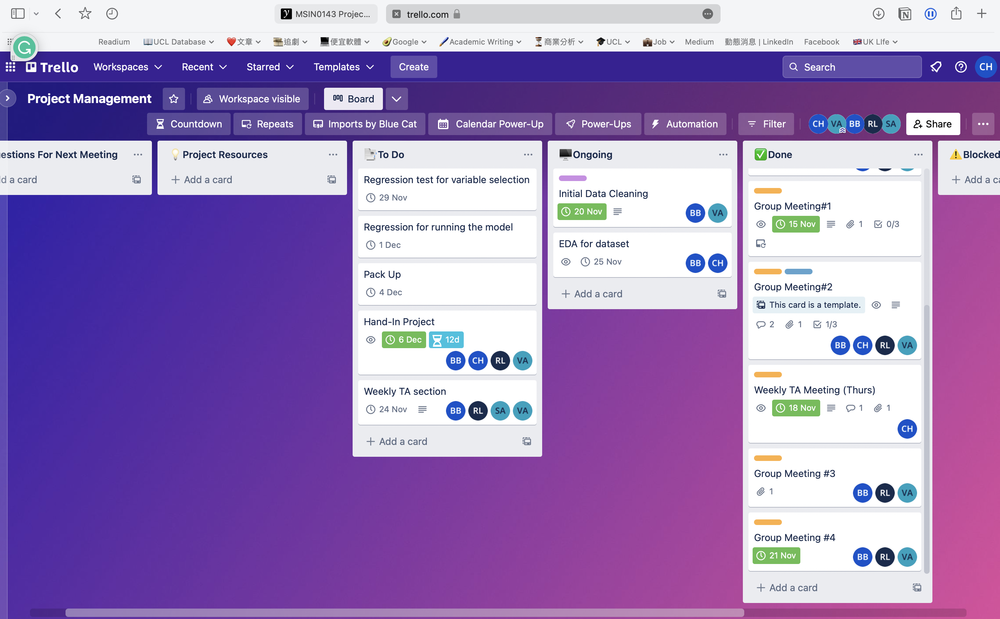

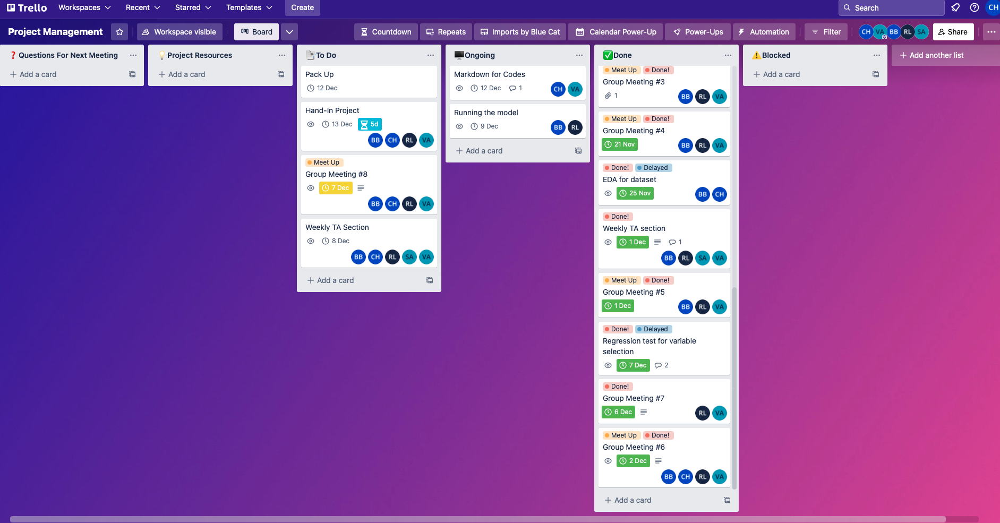

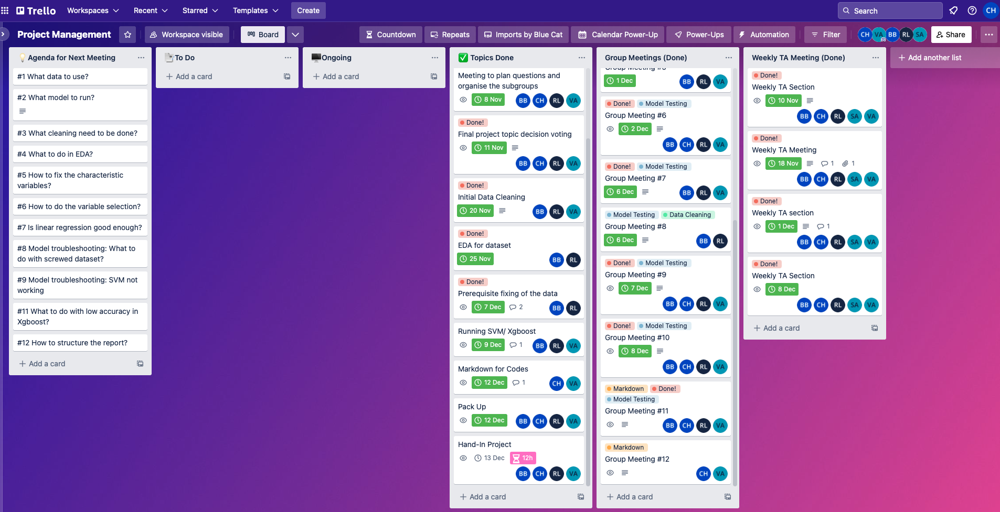

In [14]:
display.Image("Trello Screenshot 1.png")
display.Image("Trello Screenshot 2.png")
display.Image("Trello Screenshot 3.png")
display.Image("Trello Screenshot 4.png")

#### Trello Calendars

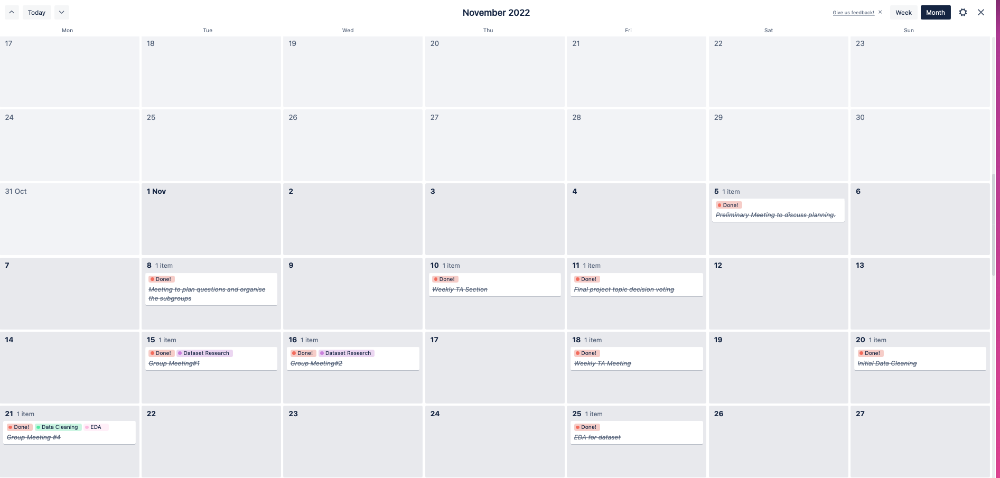

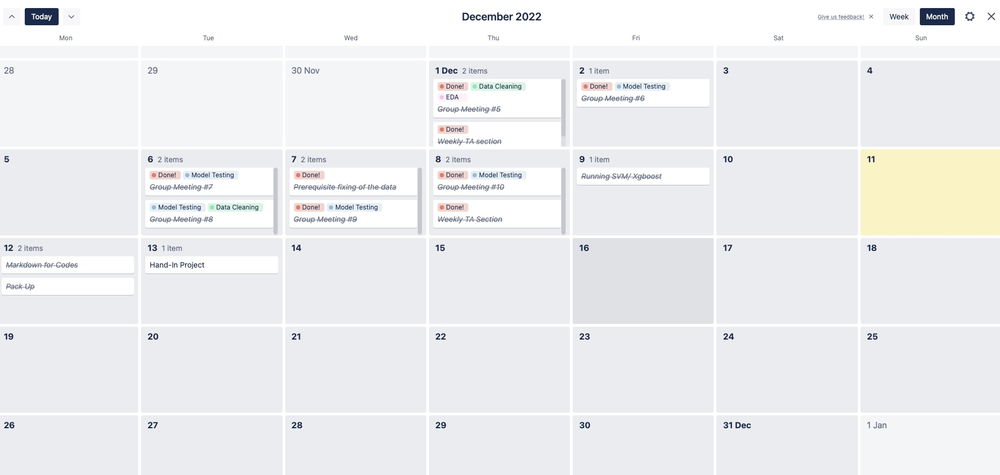

In [15]:
display.Image("Trello Screenshot 5.png")
display.Image("Trello Screenshot 6.png")

Remark: All members participated in their relative meetings (attendance is recorded in Trello Screenshot 4)

## Word Count

In [24]:
# The wordcount was printed before references and appendix.

def wordcount(nb_filename):
    with open(nb_filename) as json_file:
          data = json.load(json_file)
    wordCount = 0
    for each in data['cells']:
        cellType = each['cell_type']
        if cellType == "markdown":
            content = each['source']
            for line in content:
                temp = [word for word in line.split()]
                wordCount = wordCount + len(temp)
    return wordCount

wordcount("MSIN00143 Group D2 - The Economic Loss from Fire Incidents - A Machine Learning Approach.ipynb")

1989